In [1]:
# standard libraries
import sys
sys.path.append("../pipelines")
import pathlib

# dependent packages
import yaml
import decode as dc
import pandas as pd
import numpy as np
from scipy import signal
from scipy import fft
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import aplpy

# user-defined packages
from utils.functions import makecontinuum
from utils.functions import resample_with_equal_dt
from utils.functions import detrend
from utils.functions import plot_filter_response

# style settings
plt.style.use("seaborn-dark")
plt.style.use("seaborn-muted")

In [2]:
# load DFITS and params
dfits_file = pathlib.Path("../data/dfits_20171115124855.fits") # Uranus
yaml_file = pathlib.Path("../yaml/beammap_params.yaml")
with open(yaml_file) as file:
    params = yaml.load(file, Loader=yaml.SafeLoader)

output_dir = pathlib.Path(params["file"]["output_dir"]).expanduser()
dpi = params["file"]["dpi"]
ch = params["loaddfits"]["ch"]

cube_fits = output_dir / "cube.fits"
cont_fits = output_dir / "cont.fits"

array = dc.io.loaddfits(dfits_file, **params["loaddfits"])
array_interp = 

subarray = array[10000:]
scanarray = array[array.scantype=="SCAN"]

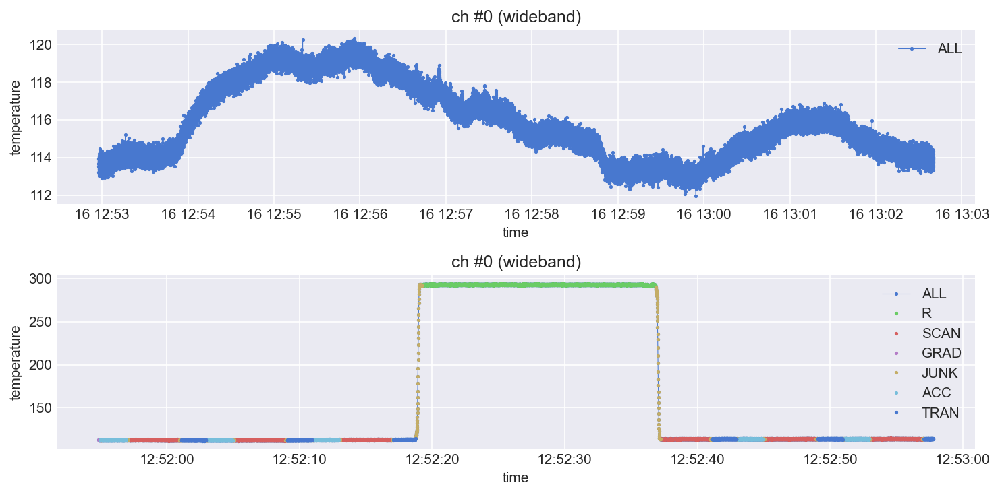

In [13]:
# plot time stream data
fig, ax = plt.subplots(2, 1, figsize=(10, 5), dpi=dpi)

plot_params0 = {"marker": ".", "markersize": 3.0, "linewidth": 0.5}
plot_params1 = {"marker": ".", "markersize": 3.0, "linestyle": "None"}

dc.plot.plot_timestream(subarray, ch, ax=ax[0], **plot_params0) # plot every 100 points

dc.plot.plot_timestream(array[:10000], ch, ax=ax[1], **plot_params0)
dc.plot.plot_timestream(array[:10000], ch, scantypes=["R"], ax=ax[1], **plot_params1)
dc.plot.plot_timestream(array[:10000], ch, scantypes=["SCAN"], ax=ax[1], **plot_params1)
dc.plot.plot_timestream(array[:10000], ch, scantypes=["GRAD"], ax=ax[1], **plot_params1)
dc.plot.plot_timestream(array[:10000], ch, scantypes=["JUNK"], ax=ax[1], **plot_params1)
dc.plot.plot_timestream(array[:10000], ch, scantypes=["ACC"], ax=ax[1], **plot_params1)
dc.plot.plot_timestream(array[:10000], ch, scantypes=["TRAN"], ax=ax[1], **plot_params1)

ax[0].grid(which="both")
ax[1].grid(which="both")

fig.tight_layout()
fig.show()

In [ ]:
# t_rel = ((scanarray.time - scanarray.time[0]) / np.timedelta64(1, "s")).values # time offset
t_rel = ((subarray.time - subarray.time[0]) / np.timedelta64(1, "s")).values # time offset

n_sa = len(t_rel)
# n_td = len(t_d) # the number of samples

freq_sa = fft.fftfreq(n_sa, d=1/fs) # frequency
# freq_td = fft.fftfreq(n_td, d=1/fs)
f_sa = fft.fft(scanarray.values, axis=0)
# f_xd = fft.fft(x_d.values, axis=0)
# f_yd = fft.fft(y_d.values, axis=0)
amp_sa = np.abs(f_sa / (n_sa / 2))
# amp_xd = np.abs(f_xd / (n_td / 2))
# amp_yd = np.abs(f_yd / (n_td / 2))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5), dpi=dpi)

ax.loglog(freq_sa[1:int(n_sa / 2)], amp_sa[1:int(n_sa / 2), 10], label="scanarray")
# ax.loglog(freq_td[1:int(n_td / 2)], amp_xd[1:int(n_td / 2), 3], label="detrend")
# ax.loglog(freq_td[1:int(n_td / 2)], amp_yd[1:int(n_td / 2), 3], label="filtered")
ax.set_xlabel("Frequency [Hz]")
ax.set_ylabel("Amplitude")
ax.legend()

fig.show()